In [3]:
cd ..

/home/msi/projects/diplomka


In [80]:
import scipy.stats as st

In [86]:
%%time
st.norm.cdf(1.6)

CPU times: user 236 µs, sys: 9 µs, total: 245 µs
Wall time: 232 µs


0.945200708300442

In [90]:
245 * 21000

5145000

In [115]:
probs = [(x,st.norm.ppf(x/1000)) for x in range(1, 1000)]

In [116]:
x = 0.945200708300442


In [117]:
i = len(probs)//2

In [118]:
import matplotlib.pyplot as plt

In [119]:
import numpy as np

In [120]:
takeClosest = lambda num,collection:min(collection,key=lambda x:abs(x[1]-num))

In [121]:
%%time 
takeClosest(x, probs)

CPU times: user 253 µs, sys: 11 µs, total: 264 µs
Wall time: 271 µs


(828, 0.9462913579615758)

In [4]:
import torch as pt

In [5]:
import pandas as pd

In [6]:
from glob import glob 

In [7]:
list(glob('data/out/GLOW-CSCS_LCG2/*.json'))

['data/out/GLOW-CSCS_LCG2/2607:f388:101c:1000::442->2001:620:808:4129::15.json',
 'data/out/GLOW-CSCS_LCG2/144.92.180.76->148.187.129.15.json',
 'data/out/GLOW-CSCS_LCG2/2607:f388:101c:1000::441->2001:620:808:4129::15.json',
 'data/out/GLOW-CSCS_LCG2/144.92.180.75->148.187.129.15.json']

In [8]:
df = pd.read_json("data/out/GLOW-CSCS_LCG2/144.92.180.75->148.187.129.15.json").T

## n_hops

In [9]:
df['n_hops_anomaly'] = df['n_hops'].apply(lambda x: x[0])
df['n_hops_anomaly'] = df['n_hops_anomaly'].apply(lambda x: True if x=='true' else False)

In [10]:
df['n_hops_prob'] = df['n_hops'].apply(lambda x: x[1])

In [11]:
df.drop(columns='n_hops', inplace=True)

## path

In [12]:
df['path_anomaly'] = df['path'].apply(lambda x: x[0])

In [13]:
df['path_prob'] = df['path'].apply(lambda x: x[1])

In [14]:
df.drop(columns='path', inplace=True)

## IP 

In [15]:
df['ip_has_anomaly'] = df['ip'].apply(lambda x: True if x[0]=='true' else False)

In [16]:
df['ip_probs'] = df['ip'].apply(lambda x: x[1])

In [17]:
df['mean_ip_prob'] = df['ip'].apply(lambda x: x[2])

In [18]:
df.drop(columns='ip', inplace=True)

## ASN

In [19]:
df['asn_has_anomaly'] = df['asn'].apply(lambda x: x[0])

In [20]:
df['asn_probs'] = df['asn'].apply(lambda x: x[1])

In [21]:
df['mean_asn_prob'] = df['asn'].apply(lambda x: x[2])

In [22]:
df.drop(columns='asn', inplace=True)

## Reaching destination

In [23]:
df['reached_anomaly'] = df['reached'].apply(lambda x: x[0])

In [24]:
df['reached_prob'] = df['reached'].apply(lambda x: x[1])

In [25]:
df['reached_score'] = df['reached'].apply(lambda x: x[2])

In [26]:
df.drop(columns='reached', inplace=True)

## rtts

In [27]:
df['rtt_anomalies'] = df['rtts'].apply(lambda x: x[0])

In [28]:
df['rtt_probs'] = df['rtts'].apply(lambda x:  x[1])

In [29]:
df.drop(columns='rtts', inplace=True)

## tlls

In [30]:
df['ttl_anomalies'] = df['ttls'].apply(lambda x: x[0])

In [31]:
df['ttl_probs'] = df['ttls'].apply(lambda x: x[1])

In [32]:
df.drop(columns='ttls', inplace=True)

In [33]:
pd.options.display.max_columns = None

In [34]:
import numpy as np

In [35]:
df.columns

Index(['ts', 'ip_hash', 'unique_asns', 'has_anomaly', 'anom_share',
       'path_hash', 'n_hops_anomaly', 'n_hops_prob', 'path_anomaly',
       'path_prob', 'ip_has_anomaly', 'ip_probs', 'mean_ip_prob',
       'asn_has_anomaly', 'asn_probs', 'mean_asn_prob', 'reached_anomaly',
       'reached_prob', 'reached_score', 'rtt_anomalies', 'rtt_probs',
       'ttl_anomalies', 'ttl_probs'],
      dtype='object')

In [36]:
df.head()

,ts,ip_hash,unique_asns,has_anomaly,anom_share,path_hash,n_hops_anomaly,n_hops_prob,path_anomaly,path_prob,ip_has_anomaly,ip_probs,mean_ip_prob,asn_has_anomaly,asn_probs,mean_asn_prob,reached_anomaly,reached_prob,reached_score,rtt_anomalies,rtt_probs,ttl_anomalies,ttl_probs
0,1672531312000,85260b76b7d0f5389cded0aa58375252b52e8ad2,e04ad8e07998f5db8420eb4ac880ec3044e7a106,True,0.4,993f432253225163792c6f3ec9482c60133f8c2b,False,0.000000,True,1.0,False,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",1.0,False,"[1.0, 1.0, 1.0, 0.5, 1.0, 1.0, 1.0, 0.4, 1.0, ...",0.882222,False,0.5,0.0,"[False, False, False, False, False, False, Fal...","[0.013159029345575002, 0.012061523619081001, 0...","[False, False, False, False, False, False, Fal...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
1,1672531548000,85260b76b7d0f5389cded0aa58375252b52e8ad2,e04ad8e07998f5db8420eb4ac880ec3044e7a106,True,0.333333,993f432253225163792c6f3ec9482c60133f8c2b,False,0.080997,False,1.0,False,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",1.0,False,"[1.0, 0.8, 0.833333333333333, 0.42857142857142...",0.783632,False,1.0,0.0,"[False, False, False, False, False, False, Fal...","[0.12680564933385502, 0.142656378258049, 0.217...","[True, True, True, True, True, True, True, Tru...","[0.006737946999085, 0.006737946999085, 0.00673..."
2,1672532133000,85260b76b7d0f5389cded0aa58375252b52e8ad2,e04ad8e07998f5db8420eb4ac880ec3044e7a106,True,0.325843,993f432253225163792c6f3ec9482c60133f8c2b,False,0.092680,False,1.0,False,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",1.0,False,"[1.0, 0.75, 0.777777777777777, 0.4, 0.8, 0.818...",0.756019,False,1.0,0.0,"[False, False, False, False, False, False, Fal...","[0.152064753051249, 0.164744697991022, 0.25062...","[True, True, True, True, True, True, True, Tru...","[0.035673993347252006, 0.035673993347252006, 0..."
3,1672532134000,85260b76b7d0f5389cded0aa58375252b52e8ad2,e04ad8e07998f5db8420eb4ac880ec3044e7a106,False,0.2,993f432253225163792c6f3ec9482c60133f8c2b,False,0.096937,False,1.0,False,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",1.0,False,"[1.0, 0.7272727272727271, 0.75, 0.384615384615...",0.742752,False,1.0,0.0,"[False, False, False, False, False, False, Fal...","[0.16304317636512602, 0.184194366514071, 0.280...","[False, False, False, False, False, False, Fal...","[0.08208499862389801, 0.08208499862389801, 0.0..."
4,1672532647000,85260b76b7d0f5389cded0aa58375252b52e8ad2,e04ad8e07998f5db8420eb4ac880ec3044e7a106,False,0.2,993f432253225163792c6f3ec9482c60133f8c2b,False,0.098923,False,1.0,False,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",1.0,False,"[1.0, 0.7142857142857141, 0.7333333333333331, ...",0.734930,False,1.0,0.0,"[False, False, False, False, False, False, Fal...","[0.17638995502062502, 0.19615120838500902, 0.3...","[False, False, False, False, False, False, Fal...","[0.135335283236612, 0.135335283236612, 0.13533..."


In [37]:
anom_columns = list(filter(lambda x: x.endswith('anomaly'), df.columns))[1:]
anom_columns


['n_hops_anomaly',
 'path_anomaly',
 'ip_has_anomaly',
 'asn_has_anomaly',
 'reached_anomaly']

In [38]:
df[anom_columns].mean(axis=1)

0        0.2
1        0.0
2        0.0
3        0.0
4        0.0
        ... 
24258    0.0
24259    0.0
24260    0.0
24261    0.0
24262    0.0
Length: 24263, dtype: float64

In [39]:
prob_columns = list(filter(lambda x: x.endswith('prob'), df.columns))
prob_columns

['n_hops_prob', 'path_prob', 'mean_ip_prob', 'mean_asn_prob', 'reached_prob']

<Axes: >

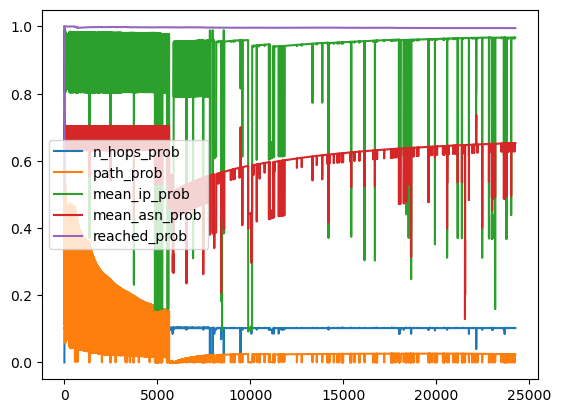

In [40]:
df[prob_columns].plot()

In [41]:
probs_columns = list(filter(lambda x: x.endswith('probs'), df.columns))
probs_columns


['ip_probs', 'asn_probs', 'rtt_probs', 'ttl_probs']

In [42]:
series = df[probs_columns].copy()

In [43]:
df.columns

Index(['ts', 'ip_hash', 'unique_asns', 'has_anomaly', 'anom_share',
       'path_hash', 'n_hops_anomaly', 'n_hops_prob', 'path_anomaly',
       'path_prob', 'ip_has_anomaly', 'ip_probs', 'mean_ip_prob',
       'asn_has_anomaly', 'asn_probs', 'mean_asn_prob', 'reached_anomaly',
       'reached_prob', 'reached_score', 'rtt_anomalies', 'rtt_probs',
       'ttl_anomalies', 'ttl_probs'],
      dtype='object')

In [44]:
anoms_columns = list(filter(lambda x: x.endswith('malies'), df.columns))
anoms_columns


['rtt_anomalies', 'ttl_anomalies']

In [45]:
df['rtt_anomalies'].apply(lambda x: np.where(x)[0]).sample(10)

3602     []
18746    []
13695    []
8959     []
23135    []
10362    []
9943     []
12688    []
17556    []
8997     []
Name: rtt_anomalies, dtype: object

In [46]:
from sklearn.cluster import DBSCAN

In [47]:
import torch as pt
import pytorch_lightning as pl


In [48]:
data = series[['rtt_probs']]

In [49]:
from tslearn.metrics import dtw, ctw

/home/msi/miniconda3/envs/stats/lib/python3.10/site-packages/tslearn/bases/bases.py:15: UserWarning: h5py not installed, hdf5 features will not be supported.
Install h5py to use hdf5 features: http://docs.h5py.org/
  warn(h5py_msg)


<Axes: >

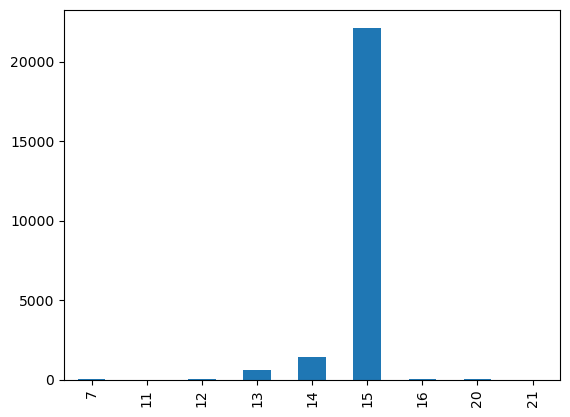

In [50]:
data.apply(lambda x: len(x[0]), axis=1).value_counts().sort_index().plot(kind='bar')

In [51]:
X = data.values.tolist()

In [52]:
X = [x[0] + [0] * (22-len(x[0])) for x in X]

In [53]:
import matplotlib.pyplot as plt

In [54]:
series

,ip_probs,asn_probs,rtt_probs,ttl_probs
0,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...","[1.0, 1.0, 1.0, 0.5, 1.0, 1.0, 1.0, 0.4, 1.0, ...","[0.013159029345575002, 0.012061523619081001, 0...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
1,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...","[1.0, 0.8, 0.833333333333333, 0.42857142857142...","[0.12680564933385502, 0.142656378258049, 0.217...","[0.006737946999085, 0.006737946999085, 0.00673..."
2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...","[1.0, 0.75, 0.777777777777777, 0.4, 0.8, 0.818...","[0.152064753051249, 0.164744697991022, 0.25062...","[0.035673993347252006, 0.035673993347252006, 0..."
3,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...","[1.0, 0.7272727272727271, 0.75, 0.384615384615...","[0.16304317636512602, 0.184194366514071, 0.280...","[0.08208499862389801, 0.08208499862389801, 0.0..."
4,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...","[1.0, 0.7142857142857141, 0.7333333333333331, ...","[0.17638995502062502, 0.19615120838500902, 0.3...","[0.135335283236612, 0.135335283236612, 0.13533..."
...,...,...,...,...
24258,"[1.0, 0.990972794723825, 0.98985947990772, 0.9...","[0.9997938994229181, 0.665357395579527, 0.6654...","[0.5118363601843681, 0.505594136181435, 1.3242...","[0.999587866804384, 0.9995841131272261, 0.9995..."
24259,"[1.0, 0.9909731668109311, 0.989859897899204, 0...","[0.9997939079180571, 0.66535744970972, 0.66547...","[0.47738328987326206, 0.48440597291609905, 1.3...","[0.99958788378906, 0.9995841304226961, 0.99958..."
24260,"[1.0, 0.9909735388673641, 0.989860315856229, 0...","[0.999793916412496, 0.665357503835436, 0.66547...","[0.47739357374172703, 0.505615601138591, 1.347...","[0.9995879007723371, 0.9995841477167271, 0.999..."
24261,"[1.0, 0.990973910893129, 0.9898607337788011, 0...","[0.9997939249062351, 0.6653575579566781, 0.665...","[0.031183622412755, 0.48442685387841605, 1.345...","[0.9995879177542151, 0.99958416500932, 0.99958..."


In [55]:
from collections import Counter

In [56]:
ctr = Counter()

In [57]:
anomaly_indices = df['rtt_anomalies'].apply(lambda x : np.where(x)[0])

In [58]:
data = df[['rtt_probs', 'rtt_anomalies']]

In [59]:
import random

In [60]:
anoms = np.array([random.choice([True, False]) for x in range(15)])

In [61]:
def extract_sequences(indexes):
    seq = []
    curr = indexes[0]
    tmp = [curr]
    for i in indexes[1:]:
        if i == curr + 1:
            tmp.append(i)

        else:
            seq.append(tmp)
            tmp = [i]
        curr = i
    if tmp:
        seq.append(tmp)
    return seq

In [62]:
def calculate_seq_weights(anoms):
    indexes = np.where(anoms)[0]
    if len(indexes) == 0:
        return np.ones(anoms.shape[0])
    seq = extract_sequences(indexes)
    final = np.ones(anoms.shape[0])
    for s in seq:
        l = len(s) 
        for i in s:
            final[i] += l
            l-=1
    return final 

In [63]:
anom_w = calculate_seq_weights(anoms)

In [64]:
anom_w

array([2., 1., 2., 1., 1., 1., 3., 2., 1., 2., 1., 1., 1., 1., 1.])

In [65]:
anom_w/np.sum(anom_w)

array([0.0952381 , 0.04761905, 0.0952381 , 0.04761905, 0.04761905,
       0.04761905, 0.14285714, 0.0952381 , 0.04761905, 0.0952381 ,
       0.04761905, 0.04761905, 0.04761905, 0.04761905, 0.04761905])

In [66]:
from collections import defaultdict

In [67]:
from scipy.stats import hmean

In [68]:
hmean([[.1,.2,.3],[.2,.2,.3], ], axis=0)

array([0.13333333, 0.2       , 0.3       ])

In [69]:
from tqdm import tqdm

In [70]:
out_data = []

total_anoms = 0
index_cnt = defaultdict(lambda : 1)
for i in tqdm(range(data.shape[0])):
    anoms = np.array(data['rtt_anomalies'].iloc[i])

    anom_w = np.ones(anoms.shape[0])
    _anoms = np.where(anoms)[0]

    for j in _anoms:
        total_anoms += 1
        index_cnt[j] += 1

    for j in range(anoms.shape[0]):
        anom_w[j] = index_cnt[j]/max(total_anoms, anoms.shape[0]+1)
    
    uniform_w = np.ones(anoms.shape[0])
    uniform_w /= np.sum(uniform_w)

    seq_w = calculate_seq_weights(anoms)
    seq_w /= np.sum(seq_w)
    
    d = np.array(data['rtt_probs'].iloc[i])
    
    out = []
    out.append(np.mean(d))
    # out.append(hmean(d))
    
    # out.append(d @ uniform_w.T)
    # # out.append(hmean(d * uniform_w))

    # # out.append(d @ anom_w)
    # out.append(d @ anom_w.T)

    # # out.append(d @ seq_w)
    # out.append(d @ seq_w.T)


    # out.append(d @ hmean([uniform_w, anom_w], axis=0).T)
    # out.append(d @ hmean([uniform_w, seq_w], axis=0).T)
    # out.append(d @ hmean([anom_w, seq_w], axis=0).T)
    out.append(d @ hmean([uniform_w, anom_w, seq_w], axis=0).T)
    
    # out.append(d @ np.mean([uniform_w, anom_w], axis=0).T)
    # out.append(d @ np.mean([uniform_w, seq_w], axis=0).T)
    # out.append(d @ np.mean([anom_w, seq_w], axis=0).T)
    out.append(d @ np.mean([uniform_w, anom_w, seq_w], axis=0).T)
    out_data.append(out)

100%|██████████| 24263/24263 [00:17<00:00, 1410.61it/s]


In [71]:
X = np.array(out_data)

In [72]:
X.shape

(24263, 3)

In [73]:
X/=X.shape[1]

In [74]:
T = pd.DataFrame(X,
                #   columns=['mean', 'hmean', 'uniform', 'anom', 'seq', 'hmean_uni_anom', 'hmean_uni_seq', 'hmean_anom_seq', 'hmean_uni_anom_seq', 'mean_uni_anom', 'mean_uni_seq', 'mean_anom_seq', 'mean_uni_anom_seq'],
                  columns=['mean', 'hmean_mix', 'mean_mix'],
                  )

In [75]:
T['index'] = pd.to_datetime(df.ts, unit='ms')

In [76]:
T.set_index('index', inplace=True)

In [79]:
# K = (T
#  )

#.diff().apply(lambda x: -np.log1p(x))

T.plot(backend='plotly')

In [78]:
K = -(T
    #  .apply(lambda x: -np.log1p(x))
 ).diff()

K.plot(backend='plotly')

In [77]:
from traced.models import NormalModel

In [78]:
K.to_csv("streamlit/data/data.csv")

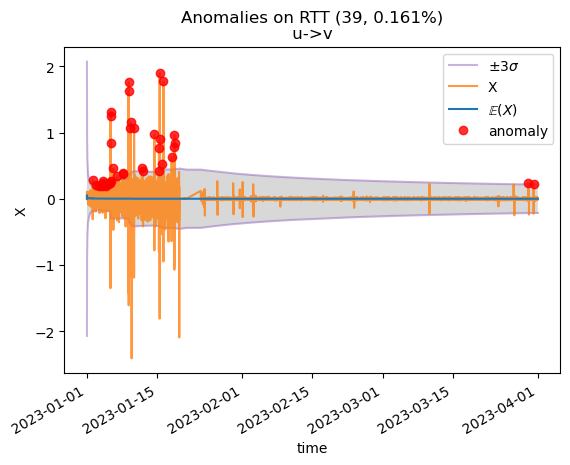

In [141]:
m = NormalModel("u", "v", one_sided=True, alpha_0=0.1, sigma_0=.1, mu_0=0)
scores = []
for i, x in K['mean'].fillna(0).items():
    scores.append(m.log(i.timestamp()*1000, x))
m.plot()

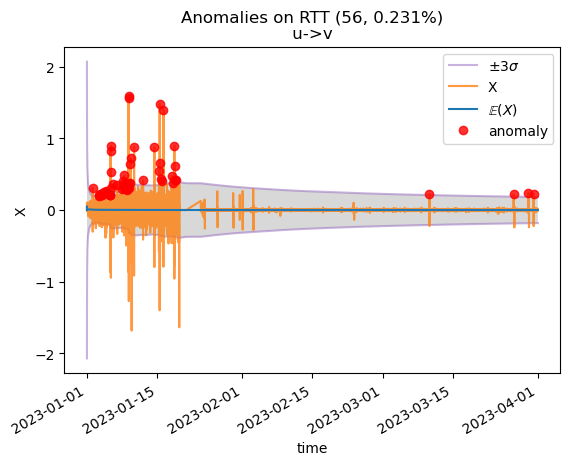

In [142]:
m = NormalModel("u", "v", one_sided=True, alpha_0=0.1, sigma_0=.1, mu_0=0)
scores = []
for i, x in K['hmean_mix'].fillna(0).items():
    scores.append(m.log(i.timestamp()*1000, x))
m.plot()

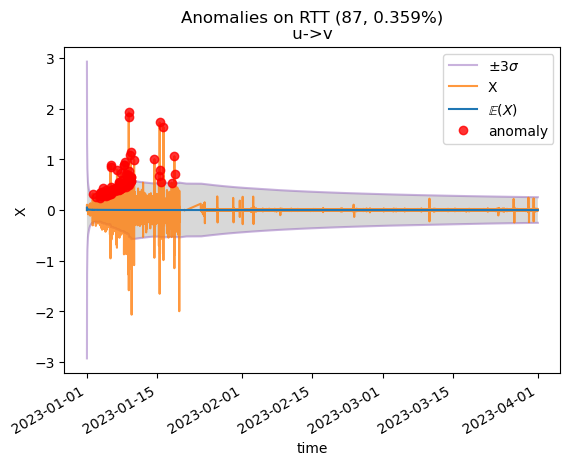

In [146]:
m = NormalModel("u", "v", one_sided=True, alpha_0=0.1, sigma_0=4, mu_0=1)
scores = []
for i, x in K['mean_mix'].fillna(0).items():
    scores.append(m.log(i.timestamp()*1000, x))
m.plot()

In [147]:
np.where(m.to_frame()['anomalies'])

(array([ 332,  532,  731,  740,  774,  799,  808,  813,  852,  894,  915,
        1030, 1034, 1047, 1076, 1089, 1208, 1298, 1301, 1334, 1337, 1354,
        1356, 1358, 1366, 1479, 1488, 1593, 1645, 1660, 1673, 1687, 1700,
        1779, 1788, 1821, 1824, 1829, 1843, 1873, 1882, 1893, 1898, 1920,
        1923, 1953, 1971, 1974, 2063, 2077, 2079, 2098, 2103, 2122, 2146,
        2158, 2215, 2219, 2241, 2253, 2300, 2317, 2330, 2343, 2363, 2371,
        2376, 2386, 2400, 2420, 2430, 2466, 2471, 2483, 2488, 2502, 2518,
        2677, 3823, 4082, 4123, 4143, 4201, 4340, 4793, 4953, 4973]),)

In [ ]:
files = sorted(glob.glob(f"data/sites/{dataset}/*.json"))


In [ ]:
with open(files[1333], 'r') as f:
    data = json.load(f)

In [199]:
df.drop(columns=["ts", "reached_score", "anom_share"]).select_dtypes(include=[int, float]).plot(backend="plotly")

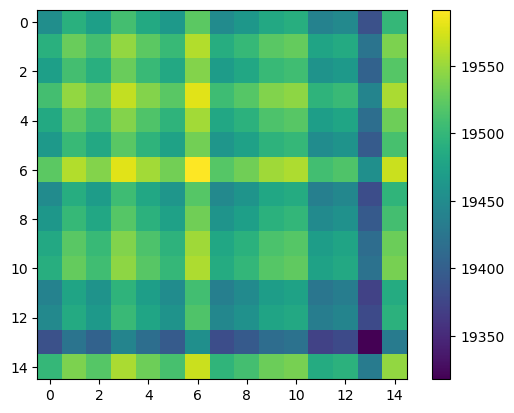

In [ ]:
plt.imshow((low.T@w).T@(low.T@w))
plt.colorbar()

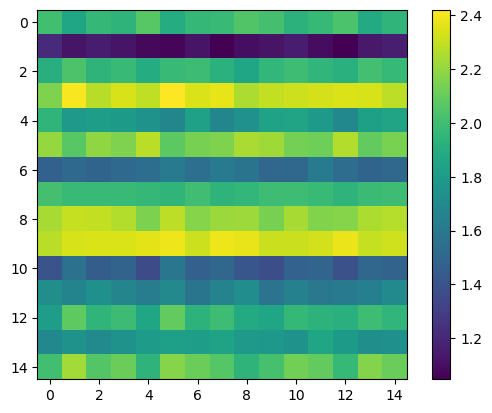

In [ ]:
plt.imshow(low.T@w)
plt.colorbar()

In [ ]:
final_w @ low

0.49532331027075044

In [ ]:
final_w @ low / low.sum()

0.182905832967279